# Example-01: Direct invariant construction

In [1]:
(* In this example approximate polynomial invariant is computed for simple symplectic mapping *)
(* Invariant level sets are compared with corresponding phase space trajectories *)
(* Mapping parameters are chosen to create 'complex' phase space trajectories *)
(* Perturbation theory strugles to approximate trajectories at large amplitudes in this case *)

In [5]:
(* Load package functions *)

<< PolynomialPerturbationTheory`

In [7]:
(* Setup mapping with numerical parameters *)

ClearAll[a, b, c] ;

a = 0.15`1000 ;

b = +1.25`1000 ;
c = -0.50`1000 ;


ClearAll[mapping];
mapping[{q_, p_}] := {p, -q + a*p + b*p^2 + c*p^3} ;

-Graphics-
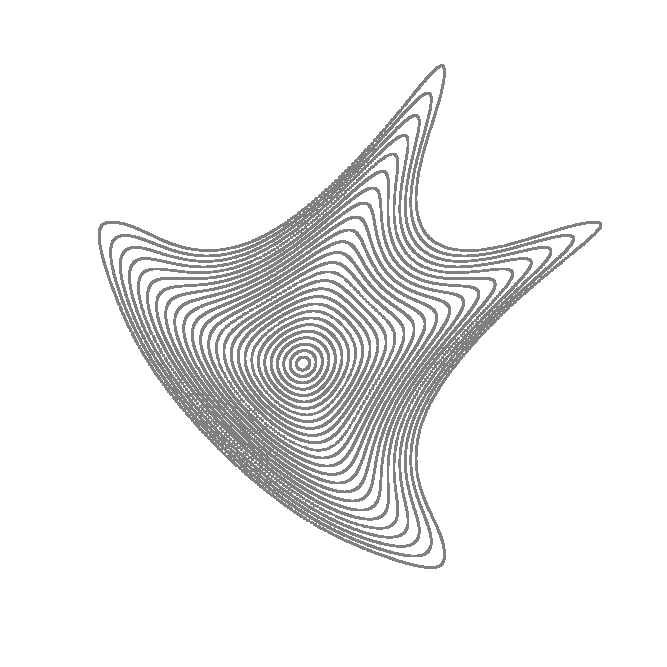

In [14]:
(* Set initial conditions and compute phase space trajectories *)

initials = Table[{q, q}, {q, 0.02, 0.52, 0.02}] ;

trajectories = ListPlot[
    Table[NestList[mapping, initial, 2^12], {initial, initials}],
    Axes -> False,
    AspectRatio -> 1,
    PlotStyle -> Directive[{Gray, Opacity[1.0], PointSize[Small]}],
    ImageSize -> 500,
    PlotRange -> {{-1.25, 1.5}, {-1.25, 1.5}}    
]

2   0.

            3        2
3   0.1875 p  - 2.5 p  q

            3           4        2         3
4   0.1875 p  + 1.4875 p  - 2.5 p  q + 1. p  q
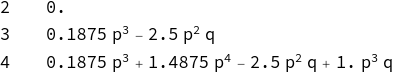

In [17]:
(* Set and test seed (linear) invariant *)

ClearAll[current] ;
current = (q^2 - a*q*p + p^2) ;

TableForm[Table[{degree, N[Chop[remainder[degree, {q, p}, mapping, current]]]}, {degree, {2, 3, 4}}]]

In [21]:
(* Main invariant computation loop *)

(* Set computation order *)
(* Note, invariant degree is order plus two, i.e. linear invariant is zero order *)

order = 20 ;

(* Set head for invariant coefficients *)

ClearAll[ci] ;
SetAttributes[ci, NHoldAll] ;

(* Set linear invariant *)

ClearAll[invariant] ;
invariant[0] = current ;

(* Compute *)

Do[
    {time, {rules, current}} = AbsoluteTiming[solve[degree, {q, p}, ci, mapping, current, False]] ;
    invariant[degree - 2] = Chop[current] ;
    Echo[{degree, time, N[Chop[Expand[remainder[degree, {q, p}, mapping, current]]]]}],
    {degree, 3, order + 2}
] ; // AbsoluteTiming

>> {3, 0.00999, 0.}
>> {4, 0.004473, 0.}
>> {5, 0.010341, 0.}
>> {6, 0.013518, 0.}
>> {7, 0.023778, 0.}
>> {8, 0.037273, 0.}
>> {9, 0.06917, 0.}
>> {10, 0.063347, 0.}
>> {11, 0.072728, 0.}
>> {12, 0.083191, 0.}
>> {13, 0.11212, 0.}
>> {14, 0.13532, 0.}
>> {15, 0.180175, 0.}
>> {16, 0.199325, 0.}
>> {17, 0.25004, 0.}
>> {18, 0.294563, 0.}
>> {19, 0.369983, 0.}
>> {20, 0.420376, 0.}
>> {21, 0.506558, 0.}
>> {22, 0.590665, 0.}


{4.95621, Null}

-Graphics-

-Graphics-

-Graphics-

-Graphics-

-Graphics-

-Graphics-

-Graphics-
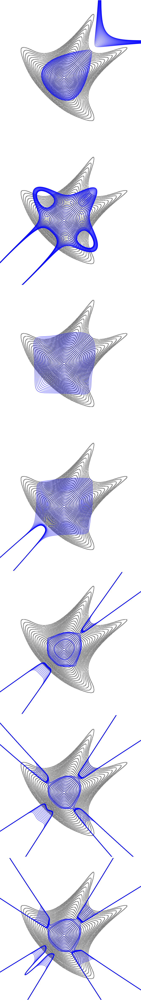

In [33]:
(* Compare level sets and phase space trajectories *)

plots = Table[
    Show[
        trajectories,
        ContourPlot[
            Evaluate[Thread[N[invariant[order]] == (N[invariant[order]] /. Thread[{q, p} -> Transpose[initials]])]],
            {q, -1.25, 1.5},
            {p, -1.25, 1.5},
            ContourStyle -> Directive[{Blue, Opacity[0.5]}],
            PlotPoints -> 100,
            MaxRecursion -> 4,
            Frame -> False
        ]    
    ],
    {order, {1, 2, 4, 8, 12, 16, 20}}
] ;

Grid[Transpose[{plots}]]

# Example-02: Direct invariant construction (semi-analitical)

In [1]:
(* In this example approximate polynomial invariant is computed for simple symplectic mapping *)
(* Mapping parameters are symbolic *)

In [3]:
(* Load package functions *)

<< PolynomialPerturbationTheory`

In [5]:
(* Setup mapping with numerical parameters *)

ClearAll[a, b, c] ;

a = 0.15`1000 ;

ClearAll[mapping];
mapping[{q_, p_}] := {p, -q + a*p + b*p^2 + c*p^3} ;

2   0.

            3         2
3   0.15 b p  - 2. b p  q

            3    2  4           4         2           3
4   0.15 b p  + b  p  + 0.15 c p  - 2. b p  q - 2. c p  q
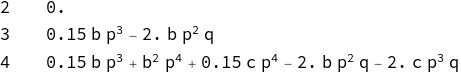

In [10]:
(* Set and test seed (linear) invariant *)

ClearAll[current] ;
current = (q^2 - a*q*p + p^2) ;

TableForm[Table[{degree, N[Chop[remainder[degree, {q, p}, mapping, current]]]}, {degree, {2, 3, 4}}]]

In [14]:
(* Main invariant computation loop *)

(* Set computation order *)
(* Note, invariant degree is order plus two, i.e. linear invariant is zero order *)

order = 10 ;

(* Set head for invariant coefficients *)

ClearAll[ci] ;
SetAttributes[ci, NHoldAll] ;

(* Set linear invariant *)

ClearAll[invariant] ;
invariant[0] = current ;

(* Compute *)

Do[
    {time, {rules, current}} = AbsoluteTiming[solve[degree, {q, p}, ci, mapping, current, False]] ;
    invariant[degree - 2] = Chop[current] ;
    Echo[{degree, time, N[Chop[Expand[remainder[degree, {q, p}, mapping, current]]]]}],
    {degree, 3, order + 2}
] ; // AbsoluteTiming

>> {3, 0.011369, 0.}
>> {4, 0.004546, 0.}
>> {5, 0.011828, 0.}
>> {6, 0.016548, 0.}
>> {7, 0.028389, 0.}
>> {8, 0.035466, 0.}
>> {9, 0.058997, 0.}
>> {10, 0.080034, 0.}
>> {11, 0.118944, 0.}
>> {12, 0.161561, 0.}


{1.39791, Null}

2               2
p  - 0.15 p q + q

 2                          2      2                 2
p  - 0.15 p q - 0.869565 b p  q + q  - 0.869565 b p q
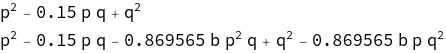

In [26]:
(* Zero and first order invariants *)

TableForm[Table[N[Chop[invariant[order]]], {order, {0, 1}}]]

# Example-03: Direct invariant construction (with averaged remainder minimization)

In [1]:
(* In this example approximate polynomial invariant is computed for simple symplectic mapping *)
(* Invariant level sets are compared with corresponding phase space trajectories *)
(* Mapping parameters are chosen to create 'complex' phase space trajectories *)
(* Perturbation theory strugles to approximate trajectories at large amplitudes in this case *)
(* Linear kernel terms are added to even orders of constructed invariant to introduce free parameters *)
(* These parameters are then used to minimize angle averaged square of invariant residual in the least square sence *)
(* Invariants with optimized recidual generaly demonstrate better performance *)

In [8]:
(* Load package functions *)

<< PolynomialPerturbationTheory`

In [10]:
(* Setup mapping with numerical parameters *)

ClearAll[a, b, c] ;

a = 0.15`1000 ;

b = +1.25`1000 ;
c = -0.50`1000 ;


ClearAll[mapping];
mapping[{q_, p_}] := {p, -q + a*p + b*p^2 + c*p^3} ;

-Graphics-
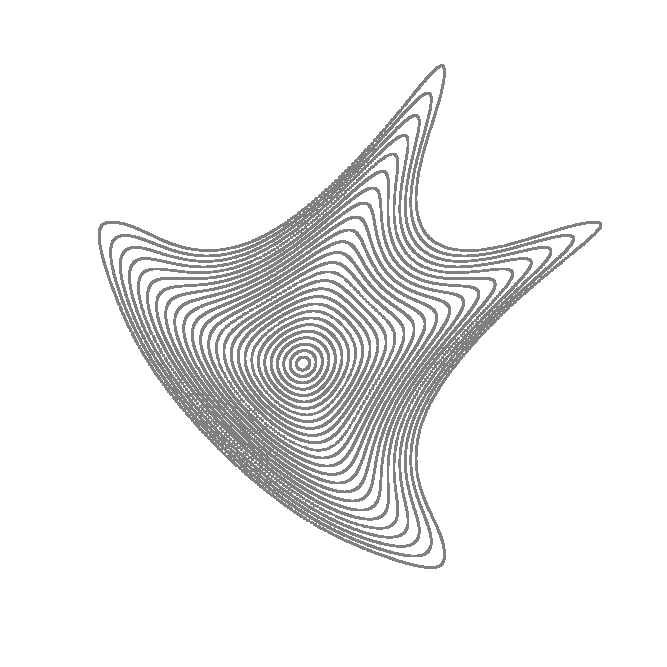

In [17]:
(* Set initial conditions and compute phase space trajectories *)

initials = Table[{q, q}, {q, 0.02, 0.52, 0.02}] ;

trajectories = ListPlot[
    Table[NestList[mapping, initial, 2^12], {initial, initials}],
    Axes -> False,
    AspectRatio -> 1,
    PlotStyle -> Directive[{Gray, Opacity[1.0], PointSize[Small]}],
    ImageSize -> 500,
    PlotRange -> {{-1.25, 1.5}, {-1.25, 1.5}}    
]

2   0.

            3        2
3   0.1875 p  - 2.5 p  q

            3           4        2         3
4   0.1875 p  + 1.4875 p  - 2.5 p  q + 1. p  q
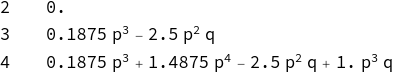

In [20]:
(* Set and test seed (linear) invariant *)

ClearAll[current] ;
current = (q^2 - a*q*p + p^2) ;

TableForm[Table[{degree, N[Chop[remainder[degree, {q, p}, mapping, current]]]}, {degree, {2, 3, 4}}]]

In [24]:
(* Main invariant computation loop *)

(* Set computation order *)
(* Note, invariant degree is order plus two, i.e. linear invariant is zero order *)

order = 15 ;

(* Set head for invariant coefficients *)

ClearAll[ci] ;
SetAttributes[ci, NHoldAll] ;

(* Set head for parameters *)

ClearAll[cp] ;
SetAttributes[cp, NHoldAll] ;

(* Set initial list of parameters *)

ClearAll[parameters] ;
parameters[0] = {} ;
parameters[1] = {} ;

(* Set linear invariant *)

ClearAll[invariant] ;
invariant[0] = current ;


(* Compute *)

Do[
    {time, {rules, current}} = AbsoluteTiming[solve[degree, {q, p}, ci, mapping, current, False]] ;
    If[
        EvenQ[degree],
        current += cp[degree/2 - 1] invariant[0]^(degree/2) ;
        parameters[degree - 2] = parameters[degree - 1] = Flatten[{parameters[degree - 4], cp[degree/2 - 1]}] ;
    ] ;     
    invariant[degree - 2] = Chop[current] ;
    Echo[{degree, time, N[Chop[Expand[remainder[degree, {q, p}, mapping, current]]]]}],
    {degree, 3, order + 2}
] ; // AbsoluteTiming

>> {3, 0.013899, 0.}
>> {4, 0.005563, 0.}
>> {5, 0.012783, 0.}
>> {6, 0.017069, 0.}
>> {7, 0.030141, 0.}
>> {8, 0.035249, 0.}
>> {9, 0.057434, 0.}
>> {10, 0.070766, 0.}
>> {11, 0.099759, 0.}
>> {12, 0.128601, 0.}
>> {13, 0.179893, 0.}
>> {14, 0.214118, 0.}
>> {15, 0.286312, 0.}
>> {16, 0.350584, 0.}
>> {17, 0.453159, 0.}


{5.83147, Null}

2               2
p  - 0.15 p q + q

 2                       2      2              2
p  - 0.15 p q - 1.08696 p  q + q  - 1.08696 p q

 2            4                       2              3      2              2
p  - 3.99671 p  - 0.15 p q - 1.08696 p  q + 1.19901 p  q + q  - 1.08696 p q  + 
 
             2  2              3            4     2               2 2
>   4.30795 p  q  + 1.19901 p q  - 3.99671 q  + (p  - 0.15 p q + q )  cp[1]
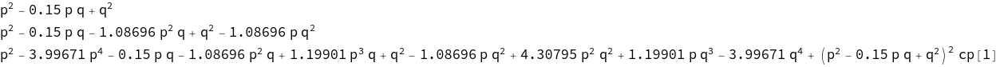

In [43]:
(* Now invariant contrains free parameters that can be used for remainder optimization *)

TableForm[Table[N[Chop[invariant[order]]], {order, {0, 1, 2}}]]

0

1

2    cp[1]

3    cp[1]

4    cp[1]   cp[2]

5    cp[1]   cp[2]

6    cp[1]   cp[2]   cp[3]

7    cp[1]   cp[2]   cp[3]

8    cp[1]   cp[2]   cp[3]   cp[4]

9    cp[1]   cp[2]   cp[3]   cp[4]

10   cp[1]   cp[2]   cp[3]   cp[4]   cp[5]
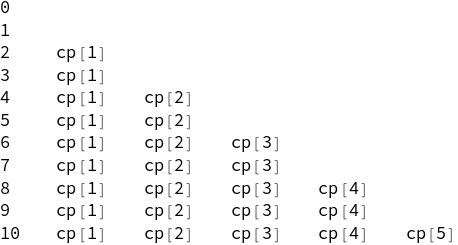

In [45]:
(* Free parameters vs order *)
(* Note, new free parameter in introduced each other order *)

TableForm[Table[Flatten[{order, parameters[order]}], {order, 0, 10}]]

In [48]:
(* Transformation rules to linear action-angle coordinate *)

transformation = {
    q -> (1 - a^2/4)^(+1/4) Sqrt[2 J] Cos[W] + a/2 (1 - a^2/4)^(-1/4) Sqrt[2 J] Sin[W],
    p -> (1 - a^2/4)^(-1/4) Sqrt[2 J] Sin[W]
} ;

In [50]:
(* Remainder optimization loop *)

(* Given an approximate invariant of order n, free kernel parameters are used to optimize corresponding remainder *)
(* Bellow, a step-by-step procedure for invariant optimization is presented *)

CleaerAll[optimized] ;

(* No free parameters to optimize the first order invariant *)

optimized[1] = N[Chop[invariant[1]]] ;

(* Set  number of remainder terms to keep *)

terms = 1 ;

(* Loop over different orders *)

Do[
    {
        (* Set current degree *)
        degree = (order + 1 + 1) ;
        (* Compute remainder *) 
        error = Chop[remainder[degree + terms, {q, p}, mapping, invariant[order]]] ;
        (* Transform to action-angle and pre-process for averaging *)
        error = Chop[Collect[error^2 /. transformation, {J}, Expand]] ; 
        (* Average over angles *)
        error = Collect[average[{W}, error], {J}, Expand] ;
        (* Separate coefficients *)
        coefficients = Map[Last, CoefficientRules[error, J]] ;
        (* Normalize coefficients *)
        coefficients = Expand[coefficients/(coefficients /. cp[_] -> 0)] ;
        (* Construct linear relations *)
        systems = Table[D[coefficient, {parameters[order]}], {coefficient, coefficients}] ;
        (* Least square solution *)
        matrix = N[Flatten[Table[D[system, {parameters[order]}], {system, systems}], 1]] ;
        vector = N[Flatten[-systems /. cp[_] -> 0, 1]] ;
        solution = Thread[parameters[order] -> LeastSquares[matrix, vector]] ;
        (* Set invariant *)
        optimized[order] = N[Chop[invariant[order]]] /. solution ;
    },
    {order, 2, 15}
] ;

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-
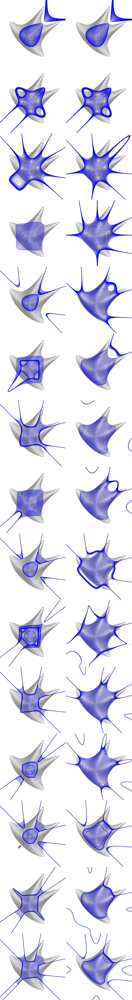

In [60]:
(* Compare level sets *)

TableForm[
    Table[
        plot$a = Show[
            trajectories,
            ContourPlot[
                Evaluate[Thread[invariant[order] == (N[Chop[invariant[order]]] /. Thread[{q, p} -> Transpose[initials]])] /. cp[_] -> 0],
                {q, -1.25, 1.5},
                {p, -1.25, 1.5},
                ContourStyle -> Directive[{Blue, Opacity[0.75]}],
                PlotPoints -> 100,
                MaxRecursion -> 4,
                Frame -> False
            ],
            Frame -> False
        ] ;
        plot$b = Show[
            trajectories,
            ContourPlot[
                Evaluate[Thread[optimized[order] == (N[Chop[optimized[order]]] /. Thread[{q, p} -> Transpose[initials]])]],
                {q, -1.25, 1.5},
                {p, -1.25, 1.5},
                ContourStyle -> Directive[{Blue, Opacity[0.75]}],
                PlotPoints -> 100,
                MaxRecursion -> 4,
                Frame -> False
            ],         
            Frame -> False
        ] ;
        Grid[{{plot$a, plot$b}}],
        {order, 1, 15}
    ]
]

In [62]:
(* Remainder optimization with several terms *)

CleaerAll[several] ;
next[1] = N[Chop[invariant[1]]] ;

terms = 4 ;

Do[
    {
        degree = (order + 1 + 1) ;
        error = Chop[remainder[degree + terms, {q, p}, mapping, invariant[order]]] ;
        error = Chop[Collect[error^2 /. transformation, {J}, Expand]] ; 
        error = Collect[average[{W}, error], {J}, Expand] ;
        coefficients = Map[Last, CoefficientRules[error, J]] ;
        coefficients = Expand[coefficients/(coefficients /. cp[_] -> 0)] ;
        systems = Table[D[coefficient, {parameters[order]}], {coefficient, coefficients}] ;
        matrix = N[Flatten[Table[D[system, {parameters[order]}], {system, systems}], 1]] ;
        vector = N[Flatten[-systems /. cp[_] -> 0, 1]] ;
        solution = Thread[parameters[order] -> LeastSquares[matrix, vector]] ;
        next[order] = N[Chop[invariant[order]]] /. solution ;
    },
    {order, 2, 15}
] ;

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-

-Graphics-   -Graphics-
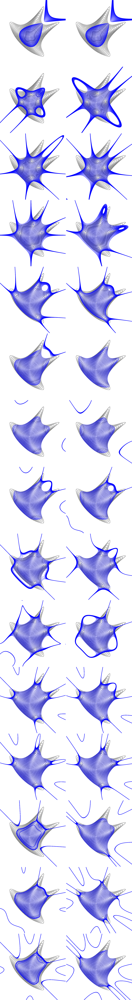

In [67]:
(* Compare level sets *)

TableForm[
    Table[
        plot$a = Show[
            trajectories,
            ContourPlot[
                Evaluate[Thread[optimized[order] == (N[Chop[optimized[order]]] /. Thread[{q, p} -> Transpose[initials]])]],
                {q, -1.25, 1.5},
                {p, -1.25, 1.5},
                ContourStyle -> Directive[{Blue, Opacity[0.75]}],
                PlotPoints -> 100,
                MaxRecursion -> 4,
                Frame -> False
            ],         
            Frame -> False
        ] ;
        plot$b = Show[
            trajectories,
            ContourPlot[
                Evaluate[Thread[next[order] == (N[Chop[next[order]]] /. Thread[{q, p} -> Transpose[initials]])]],
                {q, -1.25, 1.5},
                {p, -1.25, 1.5},
                ContourStyle -> Directive[{Blue, Opacity[0.75]}],
                PlotPoints -> 100,
                MaxRecursion -> 4,
                Frame -> False
            ],              
            Frame -> False
        ] ;
        Grid[{{plot$a, plot$b}}],
        {order, 1, 15}
    ]
]

-Graphics-
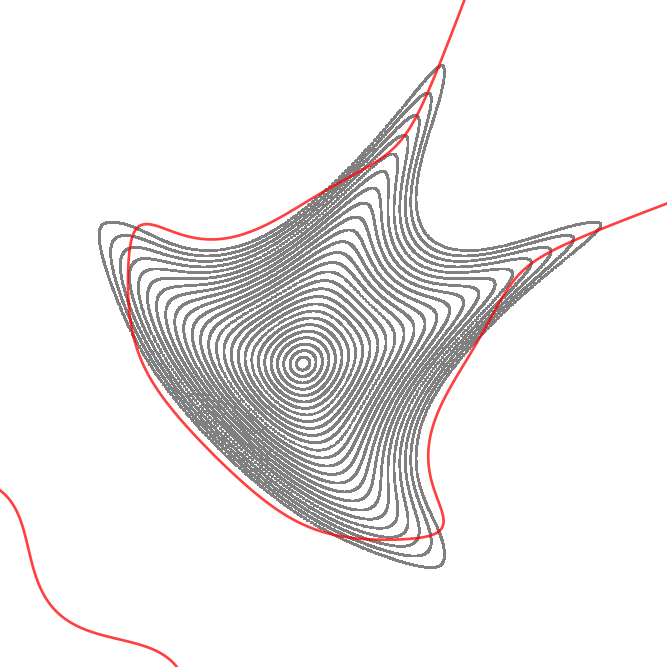

In [69]:
(* Since the original system is not integrable, exact invariant doesn't exists *)
(* All trajectories can't be matched by level sets of invariant *)
(* Yet, approximate invariants do provide some means to extimate stable center manifold region *)
(* Remainder optimization, as it can be seem from the above, provides additional means to improve this estimation accuracy *)
(* Ones the invariant has been computed, separatrix can be obrained as its critical curve *)
(* It might not even exist however or enclose a phace space region *)

order = 8 ;

Show[
    trajectories,
    ContourPlot[
        Evaluate[
            {
                (next[order] == (next[order] /. FindRoot[D[next[order], {{q, p}}] == 0, {q, 1.0}, {p, 1.0}]))
            }
        ],
        {q, -5, 5},
        {p, -5, 5},
        ContourStyle -> Directive[{Red, Opacity[0.75]}],
        PlotPoints -> 100,
        MaxRecursion -> 4,
        Frame -> False
    ]
]

# Example-04: Direct invariant construction 4D

In [1]:
(* In this example direct invariants are constructed for 4D symplectic mapping *)
(* Invariants are constructed starting from corresponding linear invariants used as seeds *)

In [3]:
(* Load package functions *)

<< PolynomialPerturbationTheory`

In [5]:
(* Define parametric mapping *)

ClearAll[ks, ko] ;
ClearAll[mapping] ;

mapping[{qx_, px_, qy_, py_}] := With[
    {
        mux = 2*Pi*0.168`1000,
        muy = 2*Pi*0.201`1000
    },
    {
        cx = Cos[mux],
        sx = Sin[mux],
        cy = Cos[muy],
        sy = Sin[muy]
    },
    {
        cx*qx + sx*(px + ks*(qx^2 - qy^2) + ko*(qx^3 - 3*qx*qy^2)),
        cx*(px + ks*(qx^2 - qy^2) + ko*(qx^3 - 3*qx*qy^2)) - sx*qx,
        cy*qy + sy*(py - 2*ks*qx*qy + ko*(-3*qx^2*qy + qy^3)),
        cy*(py - 2*ks*qx*qy + ko*(-3*qx^2*qy + qy^3)) - sy*qy
    } 
] ;

In [9]:
(* Floquet normalization (uncoupled case) *)
(* Note, the above mapping already in correct form (linear part is given by rotation *)

ClearAll[ax, bx, ay, by] ;

{ax, bx, ay, by} = {0.0`1000, 1.0`1000, 0.0`1000, 1.0`1000} ;

normalization = {
    {Sqrt[bx], 0, 0, 0}, 
    {-(ax/Sqrt[bx]), 1/Sqrt[bx], 0, 0}, 
    {0, 0, Sqrt[by], 0}, 
    {0, 0, -(ay/Sqrt[by]), 1/Sqrt[by]}
} ;

In [14]:
(* Transformed mapping *)

ClearAll[floquet] ;
floquet[{qx_, px_, qy_, py_}] := normalization . mapping[Inverse[normalization] . {qx, px, qy, py}] ;

In [17]:
(* Transformation rules to linear action-angle coordinate *)

transformation = {
    qx -> + Sqrt[2 Jx] Cos[Wx],
    px -> - Sqrt[2 Jx] Sin[Wx],
    qy -> + Sqrt[2 Jy] Cos[Wy],
    py -> - Sqrt[2 Jy] Sin[Wy]    
} ;

In [19]:
(* Linear invariants *)

ClearAll[seed$x] ;
seed$x = 1/2 (qx^2 + px^2) ;

ClearAll[seed$y] ;
seed$y = 1/2 (qy^2 + py^2) ;

remainder[2, {qx, px, qy, py}, floquet, seed$x]
remainder[2, {qx, px, qy, py}, floquet, seed$y]

0.
0.

In [26]:
(* Main invariant computation loop *)

order = 5 ;

(* Set head for invariant coefficients *)

ClearAll[cx] ;
SetAttributes[cx, NHoldAll] ;

ClearAll[cy] ;
SetAttributes[cy, NHoldAll] ;

(* Set linear invariants *)

ClearAll[ix] ;
ix[0] = seed$x ;

ClearAll[iy] ;
iy[0] = seed$y ;

(* Compute invariants *)

current = seed$x ;
Do[
    {time, {rules, current}} = AbsoluteTiming[solve[degree, {qx, px, qy, py}, cx, floquet, current, False]] ;
    ix[degree - 2] = Chop[current] ;
    Echo[{degree, time, N[Chop[Expand[remainder[degree, {qx, px, qy, py}, floquet, current]]]]}],
    {degree, 3, order + 2}
] ; // AbsoluteTiming


current = seed$y ;
Do[
    {time, {rules, current}} = AbsoluteTiming[solve[degree, {qx, px, qy, py}, cy, floquet, current, False]] ;
    iy[degree - 2] = Chop[current] ;
    Echo[{degree, time, N[Chop[Expand[remainder[degree, {qx, px, qy, py}, floquet, current]]]]}],
    {degree, 3, order + 2}
] ; // AbsoluteTiming

>> {3, 0.016541, 0.}
>> {4, 0.041143, 0.}
>> {5, 0.171367, 0.}
>> {6, 0.658013, 0.}
>> {7, 2.60121, 0.}
>> {3, 0.009904, 0.}
>> {4, 0.037599, 0.}
>> {5, 0.175038, 0.}
>> {6, 0.672114, 0.}
>> {7, 2.61543, 0.}


{13.0823, Null}
{13.3339, Null}

2         2
0.5 px  + 0.5 qx

      2                2                    2            2               2
0.5 px  - 0.21914 ks px  qx + 0.595038 ks py  qx + 0.5 qx  + 0.5 ks px qx  - 
 
                  3                                      2                   2
>   0.212856 ks qx  - 0.220605 ks px py qy - 0.5 ks px qy  + 0.26267 ks qx qy
      2         2
0.5 py  + 0.5 qy

      2                 2                                                    2
0.5 py  - 0.220605 ks py  qx + 0.664736 ks px py qy - 1. ks py qx qy + 0.5 qy  + 
 
                     2
>   0.220605 ks qx qy
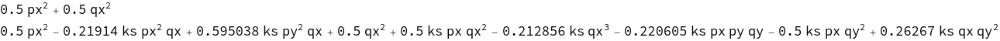
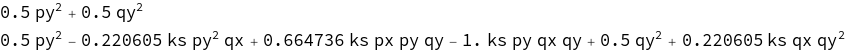

In [43]:
(* Explicit low order invariants *)

TableForm[Table[Expand[N[Chop[ix[order]]]], {order, {0, 1}}]]
TableForm[Table[Expand[N[Chop[iy[order]]]], {order, {0, 1}}]]

In [46]:
(* Kernel terms (horizontal) *)

Chop[remainder[4, {qx, px, qy, py}, floquet, ix[4]]]
Chop[remainder[4, {qx, px, qy, py}, floquet, ix[4] + seed$x^2 + seed$x seed$y]]

Chop[remainder[6, {qx, px, qy, py}, floquet, ix[6]]]
Chop[remainder[6, {qx, px, qy, py}, floquet, ix[6] + seed$x^3 + seed$x^2 seed$y + seed$x seed$y^2]]

0
0
0
0

In [51]:
(* Kernel terms (vertical) *)

Chop[remainder[4, {qx, px, qy, py}, floquet, iy[4]]]
Chop[remainder[4, {qx, px, qy, py}, floquet, iy[4] + seed$y^2 + seed$y seed$x]]

Chop[remainder[6, {qx, px, qy, py}, floquet, iy[6]]]
Chop[remainder[6, {qx, px, qy, py}, floquet, iy[6] + seed$y^3 + seed$y^2 seed$x + seed$y seed$x^2]]

0
0
0
0

In [56]:
(* Poisson bracket *)
(* Note, invariants are approximatly in involution *)

Series[Chop[Expand[bracket[{qx, px, qy, py}][ix[1], iy[1]]] /. Thread[{qx, px, qy, py} -> t*{qx, px, qy, py}]], {t, 0, 3}]
Series[Chop[Expand[bracket[{qx, px, qy, py}][ix[2], iy[2]]] /. Thread[{qx, px, qy, py} -> t*{qx, px, qy, py}]], {t, 0, 4}]
Series[Chop[Expand[bracket[{qx, px, qy, py}][ix[3], iy[3]]] /. Thread[{qx, px, qy, py} -> t*{qx, px, qy, py}]], {t, 0, 5}]
Series[Chop[Expand[bracket[{qx, px, qy, py}][ix[4], iy[4]]] /. Thread[{qx, px, qy, py} -> t*{qx, px, qy, py}]], {t, 0, 6}]
Series[Chop[Expand[bracket[{qx, px, qy, py}][ix[5], iy[5]]] /. Thread[{qx, px, qy, py} -> t*{qx, px, qy, py}]], {t, 0, 7}]

4
O[t]
    5
O[t]
    6
O[t]
    7
O[t]
    8
O[t]